## **Ensemble Technique Assignment: Term Deposit Sale**

## **Goal**
Using the data collected from existing customers, build a model that will help the marketing
team identify potential customers who are relatively more likely to subscribe term deposit
and thus increase their hit ratio. 

### **Resources Available**
The historical data for this project is available in file
https://archive.ics.uci.edu/ml/datasets/Bank+Marketing  

Source: [Moro et al., 2014] S. Moro, P. Cortez and P. Rita. A Data-Driven Approach to Predict the Success of Bank Telemarketing. Decision Support Systems, Elsevier, 62:22-31, June 2014



### **Data Set Information:**

The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be ('yes') or not ('no') subscribed.

There are four datasets:  
1) bank-additional-full.csv with all examples (41188) and 20 inputs, ordered by date (from May 2008 to November 2010), very close to the data analyzed in [Moro et al., 2014]  
2) bank-additional.csv with 10% of the examples (4119), randomly selected from 1), and 20 inputs.  
3) bank-full.csv with all examples and 17 inputs, ordered by date (older version of this dataset with less inputs).  
4) bank.csv with 10% of the examples and 17 inputs, randomly selected from 3 (older version of this dataset with less inputs).  
The smallest datasets are provided to test more computationally demanding machine learning algorithms (e.g., SVM).  

The classification goal is to predict if the client will subscribe (yes/no) a term deposit (variable y).

## **Attribute Information:**

Input variables:  
### bank client data:  
1 - age (numeric)  
2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')  
3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)  
4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')  
5 - default: has credit in default? (categorical: 'no','yes','unknown')  
6 - housing: has housing loan? (categorical: 'no','yes','unknown')  
7 - loan: has personal loan? (categorical: 'no','yes','unknown')  
### related with the last contact of the current campaign:  
8 - contact: contact communication type (categorical: 'cellular','telephone')    
9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')  
10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')  
11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.  
### other attributes:  
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)  
13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)  
14 - previous: number of contacts performed before this campaign and for this client (numeric)  
15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')  
### social and economic context attributes  
16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)  
17 - cons.price.idx: consumer price index - monthly indicator (numeric)  
18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)  
19 - euribor3m: euribor 3 month rate - daily indicator (numeric)  
20 - nr.employed: number of employees - quarterly indicator (numeric)  

Output variable (desired target):  
21 - y - has the client subscribed a term deposit? (binary: 'yes','no')  




### **Import all necessary modules and load the data**


In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt 
import seaborn as sns
import pandas_profiling

from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

from yellowbrick.classifier import ClassificationReport, ROCAUC
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz

plt.style.use('ggplot')
pd.options.display.float_format = '{:,.2f}'.format
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [2]:
df = pd.read_csv('bank.csv')

## **Deliverable I: Exploratory Data Analysis**

In [3]:
df.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,380,1,-1,0,unknown,no
8,58,retired,married,primary,no,121,yes,no,unknown,5,may,50,1,-1,0,unknown,no
9,43,technician,single,secondary,no,593,yes,no,unknown,5,may,55,1,-1,0,unknown,no


### **Univariate Analysis**

a. Univariate analysis – data types and description of the independent attributes
which should include (name, meaning, range of values observed, central values
(mean and median), standard deviation and quartiles, analysis of the body of
distributions / tails, missing values, outliers.

In [4]:
df.shape

(45211, 17)

There are 17 variables in this dataset. Some are continuous and others are categorical, with various outputs. We will explore data types, conduct distribution analysis as well as look at missing values and outliers in the dataset.

In [5]:
df.dtypes

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
Target       object
dtype: object

In [6]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,"45,211.00",40.94,10.62,18.00,33.00,39.00,48.00,95.00
balance,"45,211.00","1,362.27","3,044.77","-8,019.00",72.00,448.00,"1,428.00","102,127.00"
day,"45,211.00",15.81,8.32,1.00,8.00,16.00,21.00,31.00
duration,"45,211.00",258.16,257.53,0.00,103.00,180.00,319.00,"4,918.00"
campaign,"45,211.00",2.76,3.10,1.00,1.00,2.00,3.00,63.00
pdays,"45,211.00",40.20,100.13,-1.00,-1.00,-1.00,-1.00,871.00
previous,"45,211.00",0.58,2.30,0.00,0.00,0.00,0.00,275.00


The above statistical analysis can only be done on the continuous varibales at this time. Later we will use hot encoding to include the categorical variables in the model building.

In [7]:
df.isnull().values.any() # If there are any null values in data set

False

In [8]:
df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
Target       0
dtype: int64

As we can see there are no missing values in the dataset.

In [9]:
df.nunique()

age            77
job            12
marital         3
education       4
default         2
balance      7168
housing         2
loan            2
contact         3
day            31
month          12
duration     1573
campaign       48
pdays         559
previous       41
poutcome        4
Target          2
dtype: int64

Using n unique, we look at the numbers of unique output values for each variable. Continuous variables such as balance, durations and pdays have large amount of distinct outputs. Categorical variables have a more limited range of outcomes. Let's create graphical representations of each of those variables in the next cells.

### Continous variables

Age, Balance, Day, Duration, Campaign, pdays and previous

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


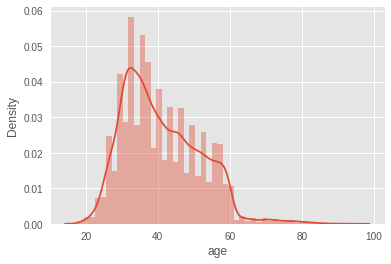

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


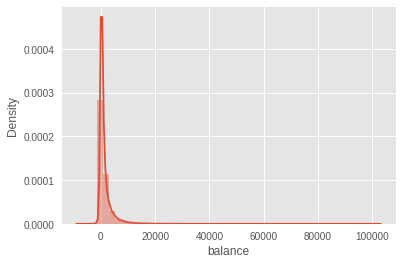

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


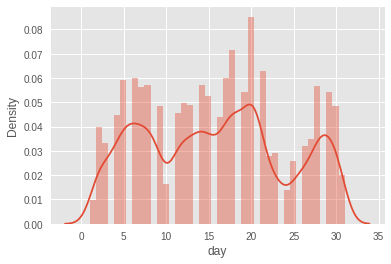

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


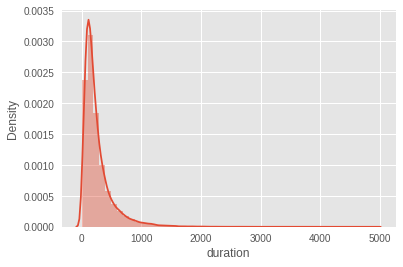

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


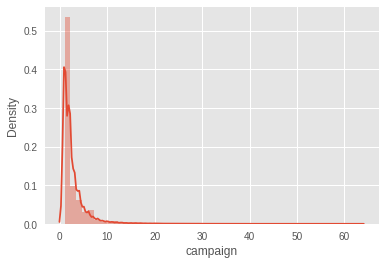

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


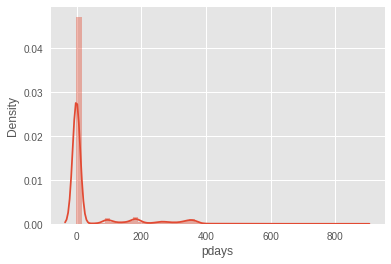

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


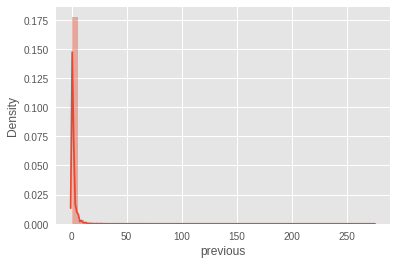

In [10]:
# distplot for continous columns
for i in ['age','balance','day','duration','campaign','pdays','previous']:
    sns.distplot(df[i])
    plt.show()

**Boxplot Representation** 

Age, Balance, Day, Duration, Campaign, pdays and previous

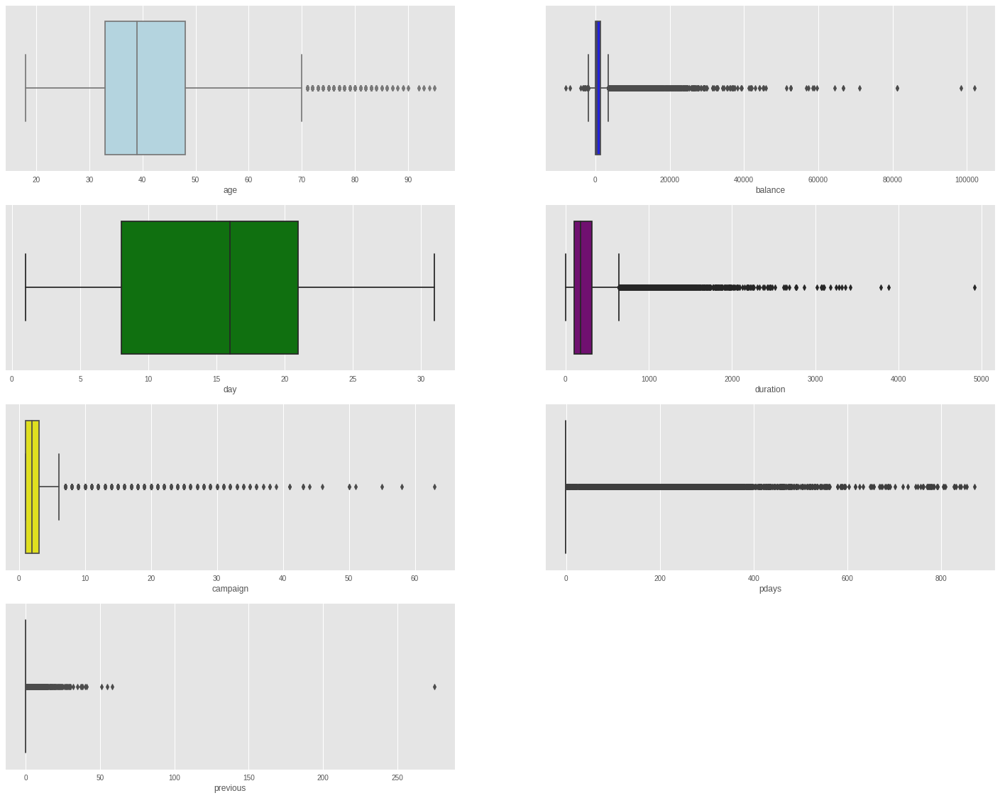

In [11]:
plt.figure(figsize= (25,25))
plt.subplot(5,2,1)
sns.boxplot(x= df.age, color='lightblue')       

plt.subplot(5,2,2)
sns.boxplot(x= df.balance, color='blue')

plt.subplot(5,2,3)
sns.boxplot(x= df.day, color='green')

plt.subplot(5,2,4)
sns.boxplot(x= df.duration, color='purple')

plt.subplot(5,2,5)
sns.boxplot(x= df.campaign, color='yellow')

plt.subplot(5,2,6)
sns.boxplot(x= df.pdays, color='brown')

plt.subplot(5,2,7)
sns.boxplot(x= df.previous, color='red')

'Duration', 'balance' and 'previous' have some outliers, who tend to slightly skew the distribution to the right. I tried reducing effect of outliers by using z-score but it ended impacting all the models negatively (i.e reducing all score values). For this reason I decided to use the orignal data as provided.

**Categorical Variables**

Job

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


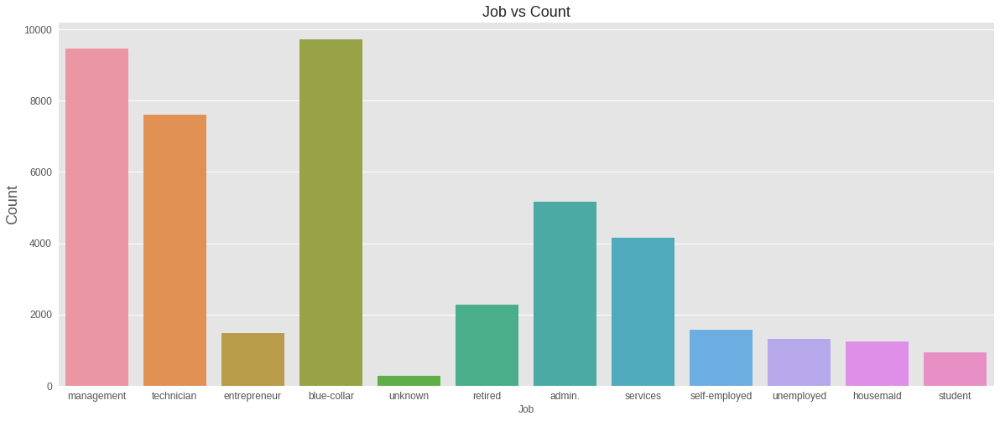

In [12]:
fig, ax=plt.subplots()
fig.set_size_inches(20,8)

#countplot
sns.countplot(df['job'],data=df)
ax.set_xlabel('Job', fontsize=12)
ax.set_ylabel('Count', fontsize=18)
ax.set_title('Job vs Count', fontsize=18)
ax.tick_params(labelsize=12)

Marital

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


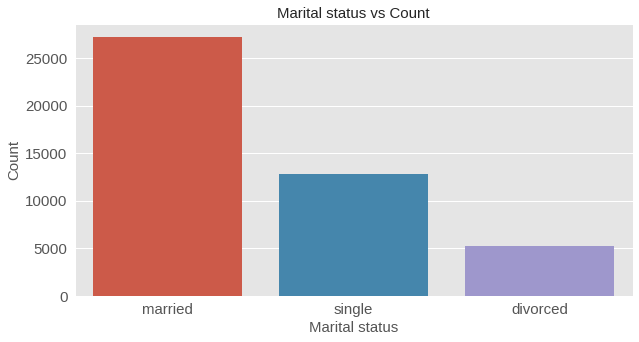

In [13]:
fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(df['marital'],data=df)
ax.set_xlabel('Marital status', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Marital status vs Count', fontsize=15)
ax.tick_params(labelsize=15)

Education

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


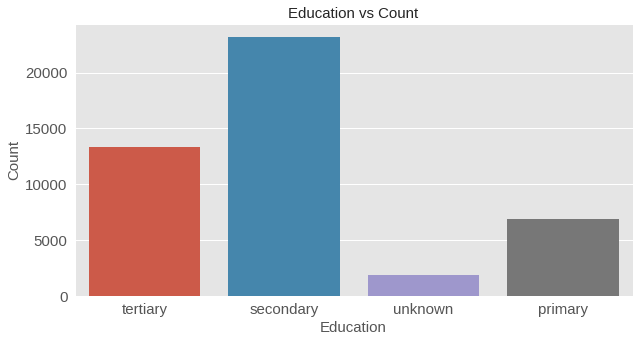

In [14]:
fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(df['education'],data=df)
ax.set_xlabel('Education', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Education vs Count', fontsize=15)
ax.tick_params(labelsize=15)

Default

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


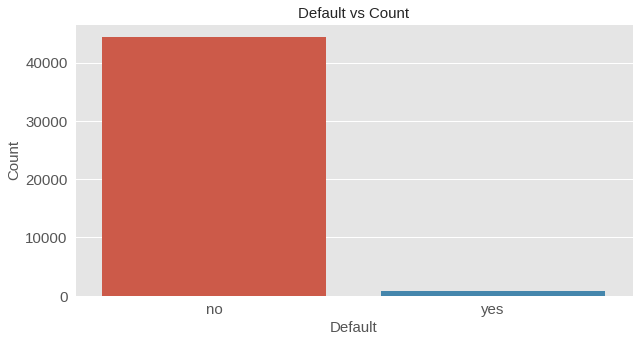

In [15]:
fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(df['default'],data=df)
ax.set_xlabel('Default', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Default vs Count', fontsize=15)
ax.tick_params(labelsize=15)


Housing

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


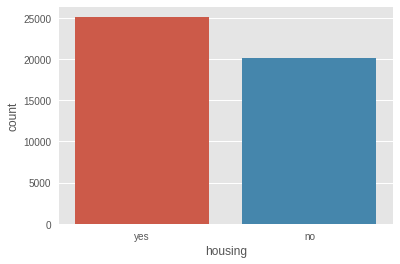

In [16]:
fig.set_size_inches(10,5)

#countplot
sns.countplot(df['housing'],data=df)
ax.set_xlabel('Housing', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Housing vs Count', fontsize=15)
ax.tick_params(labelsize=15)

Loan

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


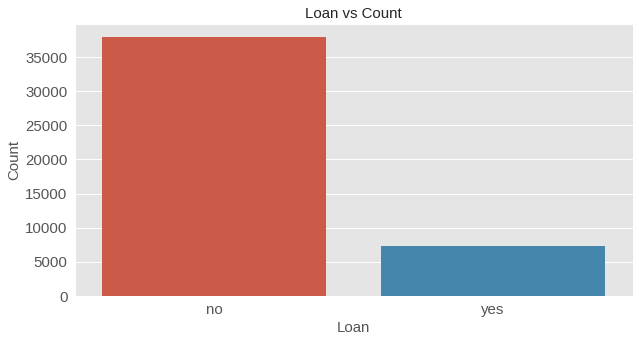

In [17]:
fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(df['loan'],data=df)
ax.set_xlabel('Loan', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Loan vs Count', fontsize=15)
ax.tick_params(labelsize=15)

Contact

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


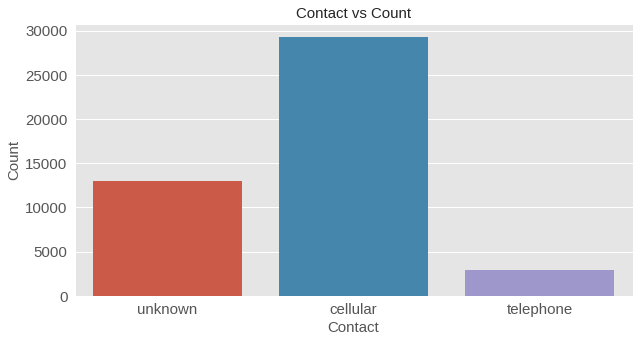

In [18]:
fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(df['contact'],data=df)
ax.set_xlabel('Contact', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Contact vs Count', fontsize=15)
ax.tick_params(labelsize=15)

Loan

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


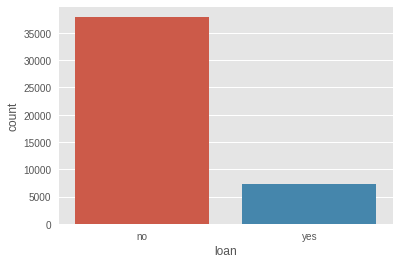

In [19]:
fig.set_size_inches(10,5)

#countplot
sns.countplot(df['loan'],data=df)
ax.set_xlabel('Loan', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Loan vs Count', fontsize=15)
ax.tick_params(labelsize=15)

Poutcome

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


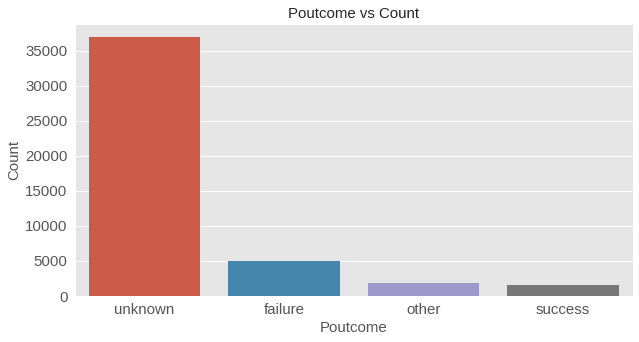

In [20]:

fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(df['poutcome'],data=df)
ax.set_xlabel('Poutcome', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Poutcome vs Count', fontsize=15)
ax.tick_params(labelsize=15)

In order to assess categorical varibales into our model we use an encoder to convert the output of those variables into integers. 

In [21]:
#Encoding of categorical variables
#importing the Encoding library
from sklearn.preprocessing import LabelEncoder
labelencoder_X=LabelEncoder()
df['job']=labelencoder_X.fit_transform(df['job'])
df['marital']=labelencoder_X.fit_transform(df['marital'])
df['education']=labelencoder_X.fit_transform(df['education'])
df['default']=labelencoder_X.fit_transform(df['default'])
df['housing']=labelencoder_X.fit_transform(df['housing'])
df['loan']=labelencoder_X.fit_transform(df['loan'])
df['contact']= labelencoder_X.fit_transform(df['contact']) 
df['month']= labelencoder_X.fit_transform(df['month']) 
df['poutcome'] = labelencoder_X.fit_transform(df['poutcome'])
df['Target'] = labelencoder_X.fit_transform(df['Target'])

In [22]:
df.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,0
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,0
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,0
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,0
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,0
5,35,4,1,2,0,231,1,0,2,5,8,139,1,-1,0,3,0
6,28,4,2,2,0,447,1,1,2,5,8,217,1,-1,0,3,0
7,42,2,0,2,1,2,1,0,2,5,8,380,1,-1,0,3,0
8,58,5,1,0,0,121,1,0,2,5,8,50,1,-1,0,3,0
9,43,9,2,1,0,593,1,0,2,5,8,55,1,-1,0,3,0


In [23]:
df.dtypes

age          int64
job          int64
marital      int64
education    int64
default      int64
balance      int64
housing      int64
loan         int64
contact      int64
day          int64
month        int64
duration     int64
campaign     int64
pdays        int64
previous     int64
poutcome     int64
Target       int64
dtype: object

We can then take a look at the resulting plots for all variables.

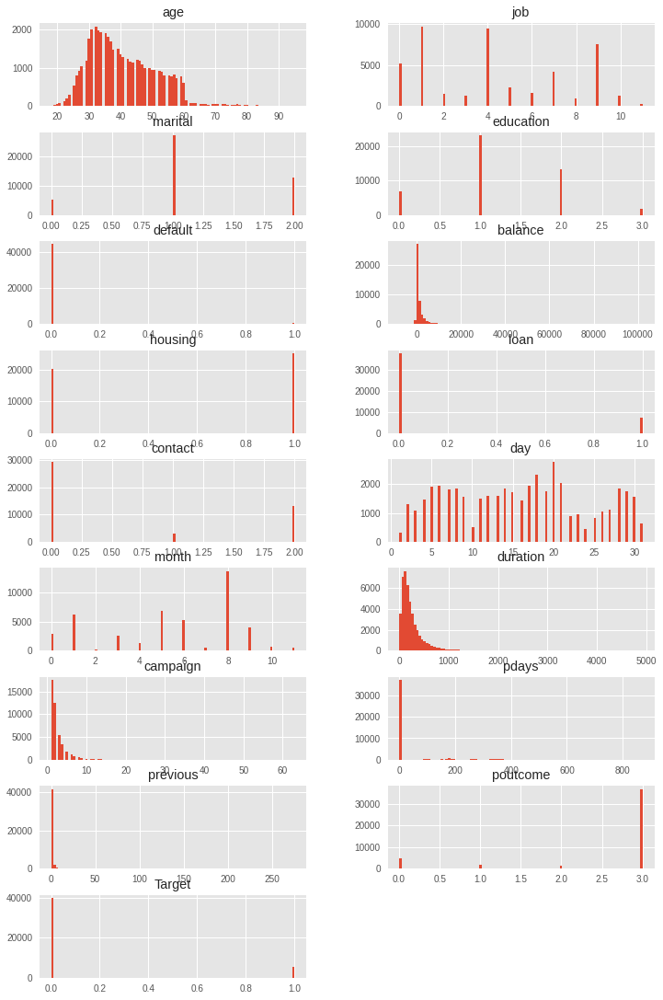

In [24]:
columns = list(df)
df[columns].hist(stacked=False, bins=100, figsize=(12,30), layout=(14,2)); 

### **Multivariate Analysis**

In this section we will explore correlations between different variables and take a deeper look at variables relative to the dependent variable 'Target'.

In [25]:
# correlation matrix 
cor=df.corr()
cor

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
age,1.00,-0.02,-0.40,-0.11,-0.02,0.10,-0.19,-0.02,0.03,-0.01,-0.04,-0.00,0.00,-0.02,0.00,0.01,0.03
job,-0.02,1.00,0.06,0.17,-0.01,0.02,-0.13,-0.03,-0.08,0.02,-0.09,0.00,0.01,-0.02,-0.00,0.01,0.04
marital,-0.40,0.06,1.00,0.11,-0.01,0.00,-0.02,-0.05,-0.04,-0.01,-0.01,0.01,-0.01,0.02,0.01,-0.02,0.05
education,-0.11,0.17,0.11,1.00,-0.01,0.06,-0.09,-0.05,-0.11,0.02,-0.06,0.00,0.01,0.00,0.02,-0.02,0.07
default,-0.02,-0.01,-0.01,-0.01,1.00,-0.07,-0.01,0.08,0.02,0.01,0.01,-0.01,0.02,-0.03,-0.02,0.03,-0.02
balance,0.10,0.02,0.00,0.06,-0.07,1.00,-0.07,-0.08,-0.03,0.00,0.02,0.02,-0.01,0.00,0.02,-0.02,0.05
housing,-0.19,-0.13,-0.02,-0.09,-0.01,-0.07,1.00,0.04,0.19,-0.03,0.27,0.01,-0.02,0.12,0.04,-0.10,-0.14
loan,-0.02,-0.03,-0.05,-0.05,0.08,-0.08,0.04,1.00,-0.01,0.01,0.02,-0.01,0.01,-0.02,-0.01,0.02,-0.07
contact,0.03,-0.08,-0.04,-0.11,0.02,-0.03,0.19,-0.01,1.00,-0.03,0.36,-0.02,0.02,-0.24,-0.15,0.27,-0.15
day,-0.01,0.02,-0.01,0.02,0.01,0.00,-0.03,0.01,-0.03,1.00,-0.01,-0.03,0.16,-0.09,-0.05,0.08,-0.03


In [26]:
# However we want to see correlation in graphical representation so below is function for that
def plot_corr(df, size=11):
    corr = df.corr()
    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(rotation=90, horizontalalignment='right')
    plt.xticks(range(len(corr.columns)), corr.columns)
    plt.yticks(range(len(corr.columns)), corr.columns)
    for (i, j), z in np.ndenumerate(corr):
        ax.text(j, i, '{:0.1f}'.format(z), ha='center', va='center')

We then plot a heat map

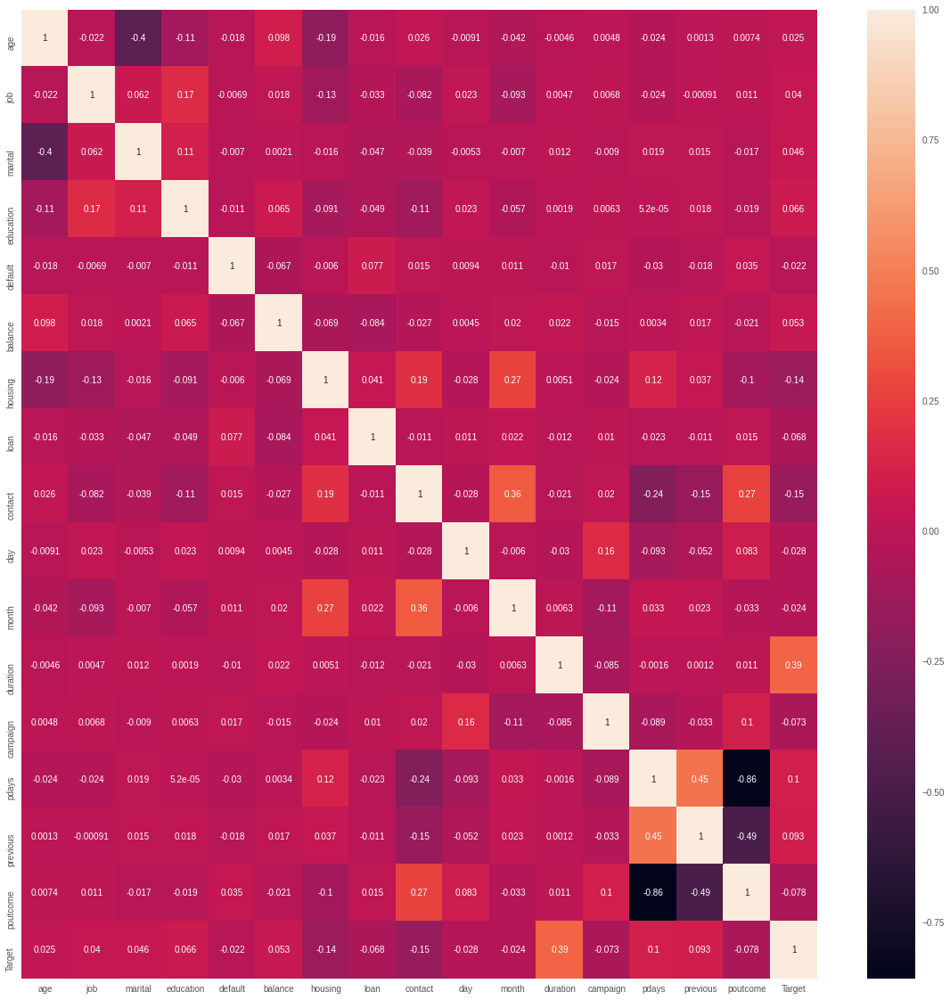

In [27]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True)
plt.show()

There is a good correlation between poutcome, previous and pdays. Duration seems to have the most impact on Target ,which is our target variable in this case, followed by previou and pdays. We plot those varibales against Target in the following cell.

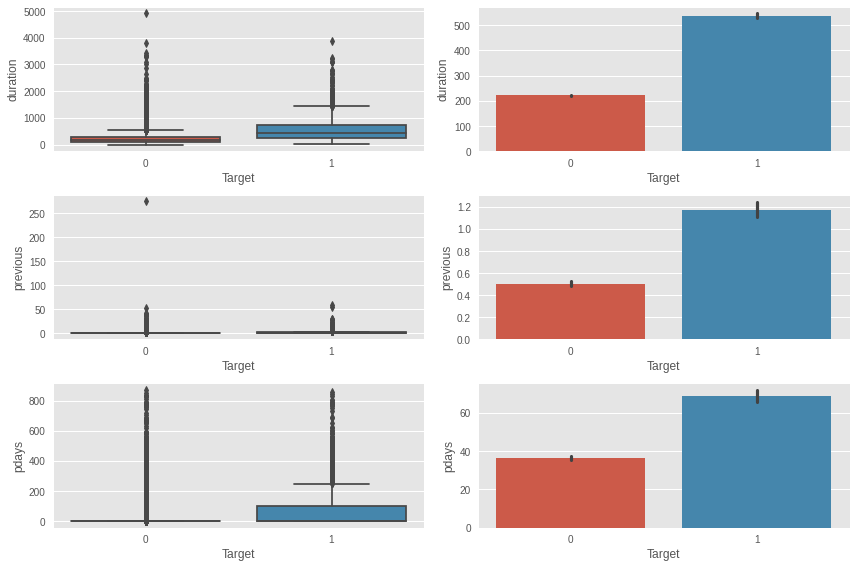

In [28]:
fig, ax=plt.subplots(3,2,figsize=(12,8))

# Categorical vs Continuous ----Target vs duration
#boxplot
sns.boxplot(x="Target", y="duration", data=df,ax=ax[0][0])

#barplot
sns.barplot(x="Target", y="duration", data=df,ax=ax[0][1])

# Categorical vs Continuous ----Target vs previous
#boxplot
sns.boxplot(x="Target", y="previous", data=df,ax=ax[1][0])
#barplot
sns.barplot(x="Target", y="previous", data=df,ax=ax[1][1])


# Categorical vs Continuous ----Target vs pdays
#boxplot
sns.boxplot(x="Target", y="pdays", data=df,ax=ax[2][0])
#barplot
sns.barplot(x="Target", y="pdays", data=df,ax=ax[2][1])

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

Additional plots: For completeness we also plot all other variables against Target.

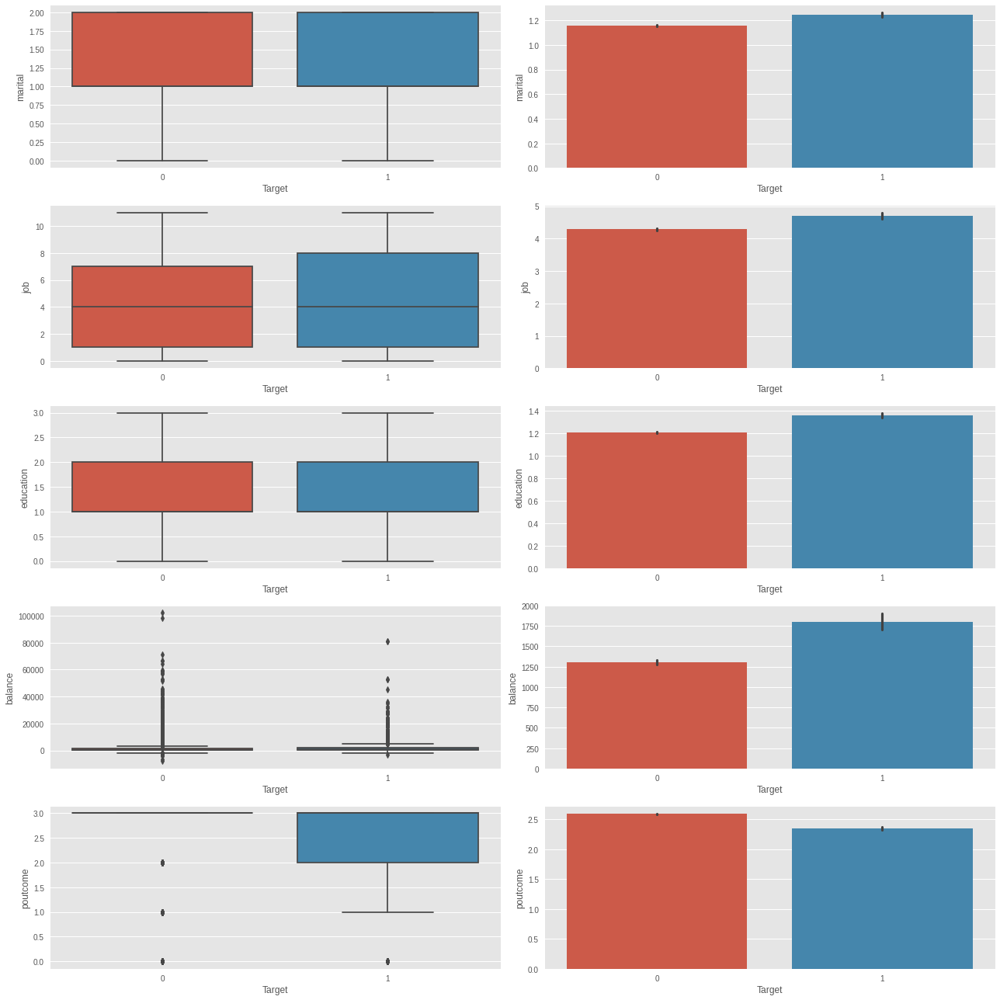

In [29]:
fig, ax=plt.subplots(5,2,figsize=(18,18))

# Categorical vs Continuous ----Target vs marital
#boxplot
sns.boxplot(x="Target", y="marital", data=df,ax=ax[0][0])
#barplot
sns.barplot(x="Target", y="marital", data=df,ax=ax[0][1])

# Categorical vs Continuous ----Target vs job
#boxplot
sns.boxplot(x="Target", y="job", data=df,ax=ax[1][0])
#barplot
sns.barplot(x="Target", y="job", data=df,ax=ax[1][1])

# Categorical vs Continuous ----Target vs education
#boxplot
sns.boxplot(x="Target", y="education", data=df,ax=ax[2][0])
#barplot
sns.barplot(x="Target", y="education", data=df,ax=ax[2][1])

# Categorical vs Continuous ----Target vs balance
#boxplot
sns.boxplot(x="Target", y="balance", data=df,ax=ax[3][0])
#barplot
sns.barplot(x="Target", y="balance", data=df,ax=ax[3][1])

# Categorical vs Continuous ----Target vs poutcome
#boxplot
sns.boxplot(x="Target", y="poutcome", data=df,ax=ax[4][0])
#barplot
sns.barplot(x="Target", y="poutcome", data=df,ax=ax[4][1])


plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

Finally, we complete our mulitvariate analysis with a classic pairplot display

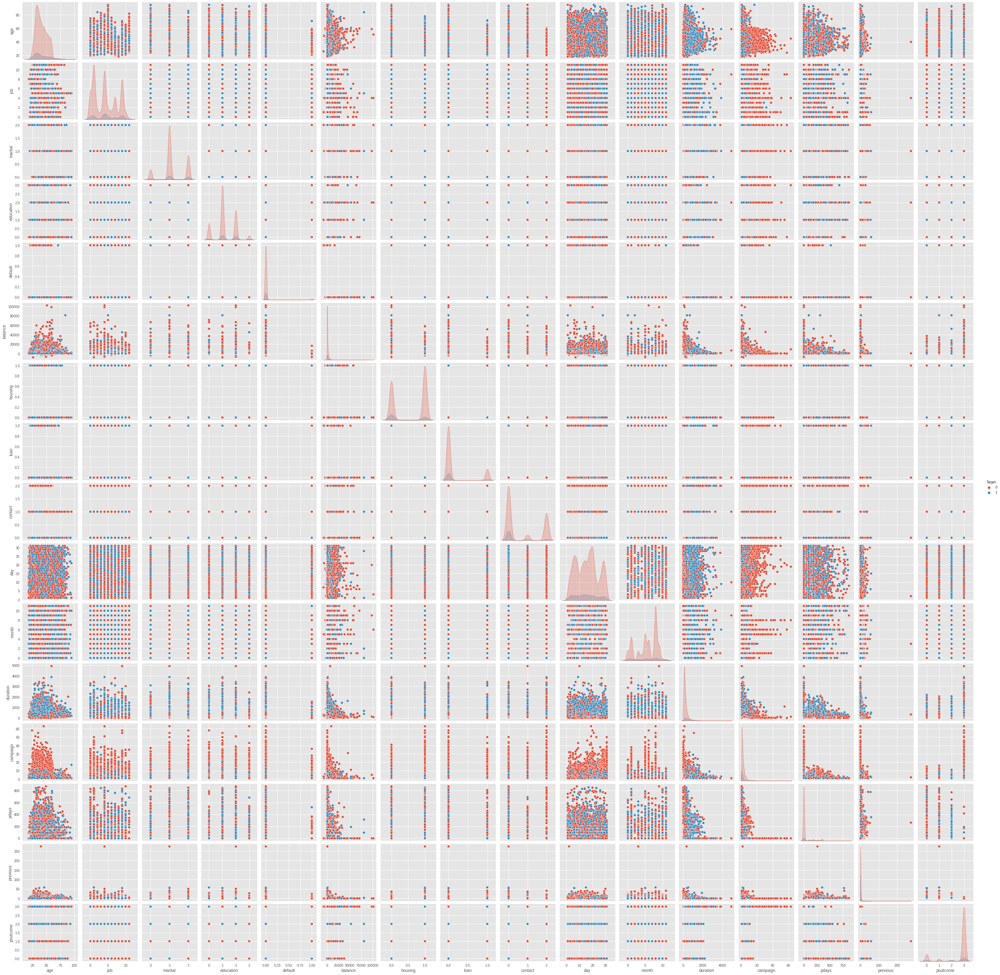

In [30]:
sns.pairplot(df,hue='Target')

## **Deliverable II: Model Preparation**

### Data Splitting

In [31]:
X=df.loc[:,df.columns!='Target']
y=df.loc[:,df.columns=='Target']

In [32]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)
columns=X_train.columns

## **Deliverable III: Ensemble Model**

## Logistic Regression 

In [33]:
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score,accuracy_score
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(random_state=100)
logreg.fit(X_train, y_train)                    # fit the model on train data

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=100, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [34]:
y_predict = logreg.predict(X_test)      

In [35]:
print("Trainig accuracy",logreg.score(X_train,y_train))  
print("Testing accuracy",logreg.score(X_test, y_test))

Trainig accuracy 0.8884570417417132
Testing accuracy 0.8841787083456207


In [36]:
## function to get confusion matrix in a proper format
def draw_cm( actual, predicted ):
    cm = confusion_matrix( actual, predicted)
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = [0,1] , yticklabels = [0,1] )
    plt.ylabel('Observed')
    plt.xlabel('Predicted')
    plt.show()

0.8841787083456207


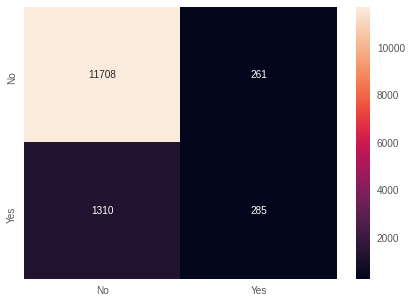

In [37]:
print(logreg.score(X_test , y_test))
y_predict = logreg.predict(X_test)

cm=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')


In [38]:
#Evaluate the model using accuracy, confusion metrix, and classification report
acc_LR=metrics.accuracy_score(y_test, y_predict)
pre_LR=metrics.precision_score(y_test, y_predict)
rec_LR=metrics.recall_score(y_test, y_predict)
f1_LR=metrics.f1_score(y_test, y_predict)
print('Accuracy LR: ',acc_LR)
print('Confusion Matrix LR: \n',metrics.confusion_matrix(y_test, y_predict))
print('Classification report LR: \n',metrics.classification_report(y_test, y_predict))
print("Roc Auc Score:",roc_auc_score(y_test,y_predict))

Accuracy LR:  0.8841787083456207
Confusion Matrix LR: 
 [[11708   261]
 [ 1310   285]]
Classification report LR: 
               precision    recall  f1-score   support

           0       0.90      0.98      0.94     11969
           1       0.52      0.18      0.27      1595

    accuracy                           0.88     13564
   macro avg       0.71      0.58      0.60     13564
weighted avg       0.85      0.88      0.86     13564

Roc Auc Score: 0.5784385262764754


In [39]:
#Store the accuracy results for each model in a dataframe for final comparison
results = pd.DataFrame({'Method':['Logistic Regression'], 'accuracy': acc_LR,'precision': pre_LR,'recall': rec_LR,'f1':f1_LR},index={'1'})
results = results[['Method', 'accuracy','precision','recall','f1']]
results

,Method,accuracy,precision,recall,f1
1,Logistic Regression,0.88,0.52,0.18,0.27


Logistic Regresion has a very poor recall score which impacts the F1 score.

## Decision Tree Model

In [40]:
# invoking the decision tree classifier function. Using 'entropy' method of finding the split columns. Other option                             
dt_model = DecisionTreeClassifier(criterion = 'entropy',random_state=100 )
#Fitting the model
dt_model.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=100, splitter='best')

In [41]:
bank_df=df
xvar = bank_df.drop('Target', axis=1)
feature_cols = xvar.columns


In [42]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz
dot_data = StringIO()
export_graphviz(dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('bank_data.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.316984 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.316984 to fit



In [43]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

           Imp
age       0.09
job       0.04
marital   0.02
education 0.02
default   0.00
balance   0.10
housing   0.03
loan      0.01
contact   0.06
day       0.09
month     0.10
duration  0.31
campaign  0.03
pdays     0.06
previous  0.01
poutcome  0.03


In [44]:
#Making the prediction
y_predict = dt_model.predict(X_test)

In [45]:
# performance on train data
print('Performance on Training data using DT: ',dt_model.score(X_train , y_train))
# performance on test data
print('Performance on Testing data using DT: ',dt_model.score(X_test , y_test))

Performance on Training data using DT:  1.0
Performance on Testing data using DT:  0.8746682394573873


0.8746682394573873


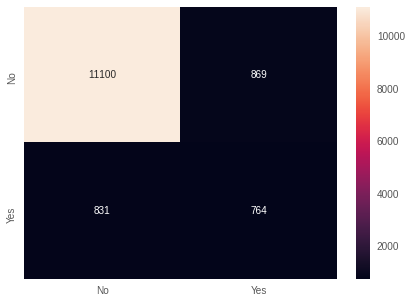

In [46]:
print(dt_model.score(X_test , y_test))
y_predict = dt_model.predict(X_test)

cm=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')


In [47]:

#Evaluate the model using accuracy, confusion metrix, and classification report
acc_DT=metrics.accuracy_score(y_test, y_predict)
pre_DT=metrics.precision_score(y_test, y_predict)
rec_DT=metrics.recall_score(y_test, y_predict)
f1_DT=metrics.f1_score(y_test, y_predict)
print('Accuracy DT: ',acc_DT)
print('Confusion Matrix DT: \n',metrics.confusion_matrix(y_test, y_predict))
print('Classification report DT: \n',metrics.classification_report(y_test, y_predict))
print("Roc Auc Score:",roc_auc_score(y_test,y_predict))

Accuracy DT:  0.8746682394573873
Confusion Matrix DT: 
 [[11100   869]
 [  831   764]]
Classification report DT: 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93     11969
           1       0.47      0.48      0.47      1595

    accuracy                           0.87     13564
   macro avg       0.70      0.70      0.70     13564
weighted avg       0.88      0.87      0.88     13564

Roc Auc Score: 0.7031963188079131


In [48]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Decision Tree'], 'accuracy': acc_DT,'precision': pre_DT,'recall': rec_DT,'f1':f1_DT},index={'2'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','precision','recall','f1']]
results


,Method,accuracy,precision,recall,f1
1,Logistic Regression,0.88,0.52,0.18,0.27
2,Decision Tree,0.87,0.47,0.48,0.47


Decision Tree overall performs better than Logistic Regression, increasing the recall score from 0.18 to 0.48. However accuracy and precision can be improved. We will apply pruning in the next step. 

## Pruning Decision Tree

In [49]:
# Regularizing the Decision tree classifier and fitting the model
reg_dt_model = DecisionTreeClassifier(criterion = 'entropy', max_depth = 7,random_state=100,min_samples_leaf=5)
reg_dt_model.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=7, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=100, splitter='best')

In [50]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

           Imp
age       0.09
job       0.04
marital   0.02
education 0.02
default   0.00
balance   0.10
housing   0.03
loan      0.01
contact   0.06
day       0.09
month     0.10
duration  0.31
campaign  0.03
pdays     0.06
previous  0.01
poutcome  0.03


In [51]:
bank_df=df
xvar = bank_df.drop('Target', axis=1)
feature_cols = xvar.columns

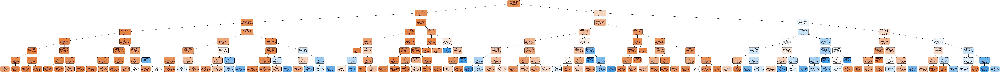

In [52]:
dot_data = StringIO()
export_graphviz(reg_dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1','2'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('bank_pruned.png')
Image(graph.create_png())

In [53]:
y_predict = reg_dt_model.predict(X_test)

In [54]:
# performance on train data
print('Performance on Training data using  Pruned DT: ',reg_dt_model.score(X_train , y_train))
# performance on test data
print('Performance on Testing data using  Pruned DT: ',reg_dt_model.score(X_test , y_test))

Performance on Training data using  Pruned DT:  0.9089329162321863
Performance on Testing data using  Pruned DT:  0.8964169861397818


0.8964169861397818


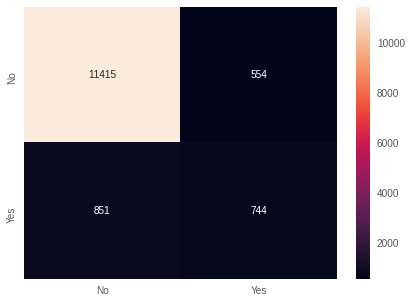

In [55]:
print(reg_dt_model.score(X_test , y_test))
y_predict = reg_dt_model.predict(X_test)

cm=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')


In [56]:
#Evaluate the model using accuracy, confusion metrix, and classification report
acc_pruned_DT=metrics.accuracy_score(y_test, y_predict)
pre_pruned_DT=metrics.precision_score(y_test, y_predict)
rec_pruned_DT=metrics.recall_score(y_test, y_predict)
f1_pruned_DT=metrics.f1_score(y_test, y_predict)
print("Accuracy Pruned DT:",acc_pruned_DT)
print('Confusion Matrix Pruned DT: \n',metrics.confusion_matrix(y_test, y_predict))
print('Classification report Pruned DT: \n',metrics.classification_report(y_test, y_predict))
print("Roc Auc Score:",roc_auc_score(y_test,y_predict))

Accuracy Pruned DT: 0.8964169861397818
Confusion Matrix Pruned DT: 
 [[11415   554]
 [  851   744]]
Classification report Pruned DT: 
               precision    recall  f1-score   support

           0       0.93      0.95      0.94     11969
           1       0.57      0.47      0.51      1595

    accuracy                           0.90     13564
   macro avg       0.75      0.71      0.73     13564
weighted avg       0.89      0.90      0.89     13564

Roc Auc Score: 0.7100857203994332


In [57]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Pruned Decision Tree'], 'accuracy': acc_pruned_DT,'precision': pre_pruned_DT,'recall': rec_pruned_DT,'f1':f1_pruned_DT},index={'3'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','precision','recall','f1']]
results

,Method,accuracy,precision,recall,f1
1,Logistic Regression,0.88,0.52,0.18,0.27
2,Decision Tree,0.87,0.47,0.48,0.47
3,Pruned Decision Tree,0.90,0.57,0.47,0.51


Prunning the Decsion Tree increased accuracy and precision of the model, without losing too much on recall comapred to non pruned decision tree.

## Bagging

In [58]:
from sklearn.ensemble import BaggingClassifier
bgcl = BaggingClassifier(base_estimator=dt_model, n_estimators=100,random_state=100)
bgcl = bgcl.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_bagging.py:645: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [59]:
# performance on train data
print('Performance on Training data using  Bagging: ',bgcl.score(X_train , y_train))
# performance on test data
print('Performance on Testing data using  Bagging: ',bgcl.score(X_test , y_test))

Performance on Training data using  Bagging:  1.0
Performance on Testing data using  Bagging:  0.9013565319964613


0.9013565319964613


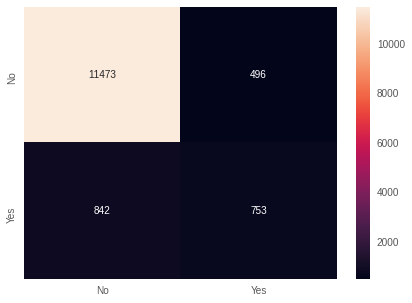

In [60]:
print(bgcl.score(X_test , y_test))
y_predict = bgcl.predict(X_test)

cm=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')


In [61]:
#Evaluate the model using accuracy, confusion metrix, and classification report
acc_bgcl=metrics.accuracy_score(y_test, y_predict)
pre_bgcl=metrics.precision_score(y_test, y_predict)
rec_bgcl=metrics.recall_score(y_test, y_predict)
f1_bgcl=metrics.f1_score(y_test, y_predict)
print("Accuracy Bagging:",acc_bgcl)
print('Confusion Matrix Bagging: \n',metrics.confusion_matrix(y_test, y_predict))
print('Classification report Bagging: \n',metrics.classification_report(y_test, y_predict))
print("Roc Auc Score:",roc_auc_score(y_test,y_predict))

Accuracy Bagging: 0.9013565319964613
Confusion Matrix Bagging: 
 [[11473   496]
 [  842   753]]
Classification report Bagging: 
               precision    recall  f1-score   support

           0       0.93      0.96      0.94     11969
           1       0.60      0.47      0.53      1595

    accuracy                           0.90     13564
   macro avg       0.77      0.72      0.74     13564
weighted avg       0.89      0.90      0.90     13564

Roc Auc Score: 0.7153299629057406


In [62]:
tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'accuracy': acc_bgcl,'precision': pre_bgcl,'recall': rec_bgcl,'f1':f1_bgcl},index={'4'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','precision','recall','f1']]
results

,Method,accuracy,precision,recall,f1
1,Logistic Regression,0.88,0.52,0.18,0.27
2,Decision Tree,0.87,0.47,0.48,0.47
3,Pruned Decision Tree,0.90,0.57,0.47,0.51
4,Bagging,0.90,0.60,0.47,0.53


Bagging outperformed all previous models in precision, whilst keeping accuracy and recall same as pruned tree.

## ADA Boosting

In [63]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(base_estimator=dt_model, n_estimators=100,random_state=100)
abcl = abcl.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [64]:
# performance on train data
print('Performance on Training data using  ADA Boosting: ',abcl.score(X_train , y_train))
# performance on test data
print('Performance on Testing data using  ADA Boostingg: ',abcl.score(X_test , y_test))

Performance on Training data using  ADA Boosting:  1.0
Performance on Testing data using  ADA Boostingg:  0.8723827779416101


0.8723827779416101


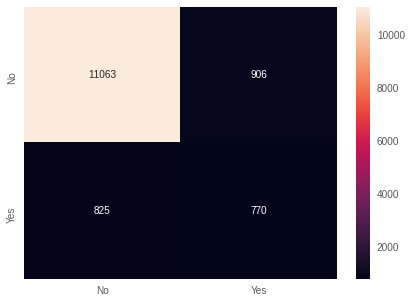

In [65]:
print(abcl.score(X_test , y_test))
y_predict = abcl.predict(X_test)

cm=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')


In [66]:
#Evaluate the model using accuracy, confusion metrix, and classification report
acc_abcl=metrics.accuracy_score(y_test, y_predict)
pre_abcl=metrics.precision_score(y_test, y_predict)
rec_abcl=metrics.recall_score(y_test, y_predict)
f1_abcl=metrics.f1_score(y_test, y_predict)
print("Accuracy ADA Boosting:",acc_abcl)
print('Confusion Matrix ADA Boosting: \n',metrics.confusion_matrix(y_test, y_predict))
print('Classification report ADA Boosting: \n',metrics.classification_report(y_test, y_predict))
print("Roc Auc Score:",roc_auc_score(y_test,y_predict))

Accuracy ADA Boosting: 0.8723827779416101
Confusion Matrix ADA Boosting: 
 [[11063   906]
 [  825   770]]
Classification report ADA Boosting: 
               precision    recall  f1-score   support

           0       0.93      0.92      0.93     11969
           1       0.46      0.48      0.47      1595

    accuracy                           0.87     13564
   macro avg       0.70      0.70      0.70     13564
weighted avg       0.88      0.87      0.87     13564

Roc Auc Score: 0.7035315369301731


In [67]:
tempResultsDf = pd.DataFrame({'Method':['ADA Boosting'], 'accuracy': acc_abcl,'precision': pre_abcl,'recall': rec_abcl,'f1':f1_abcl},index={'5'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','precision','recall','f1']]
results

,Method,accuracy,precision,recall,f1
1,Logistic Regression,0.88,0.52,0.18,0.27
2,Decision Tree,0.87,0.47,0.48,0.47
3,Pruned Decision Tree,0.90,0.57,0.47,0.51
4,Bagging,0.90,0.60,0.47,0.53
5,ADA Boosting,0.87,0.46,0.48,0.47


ADA Boosting results are very similar to first non pruned decision tree. Therefore not offering improvement from the last two models.

## Gradient Boosting

In [68]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50,random_state=100)
gbcl = gbcl.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/_gb.py:1454: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [69]:
# performance on train data
print('Performance on Training data using  Gradient Boosting: ',gbcl.score(X_train , y_train))
# performance on test data
print('Performance on Testing data using  Gradient Boosting: ',gbcl.score(X_test , y_test))

Performance on Training data using  Gradient Boosting:  0.9067842133535564
Performance on Testing data using  Gradient Boosting:  0.9003243880861103


0.9003243880861103


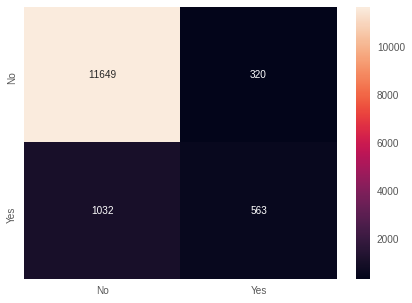

In [70]:
print(gbcl.score(X_test , y_test))
y_predict = gbcl.predict(X_test)

cm=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')


In [71]:
#Evaluate the model using accuracy, confusion metrix, and classification report
acc_gbcl=metrics.accuracy_score(y_test, y_predict)
pre_gbcl=metrics.precision_score(y_test, y_predict)
rec_gbcl=metrics.recall_score(y_test, y_predict)
f1_gbcl=metrics.f1_score(y_test, y_predict)
print("Accuracy Gradient Boosting:",acc_gbcl)
print('Confusion Matrix Gradient Boosting: \n',metrics.confusion_matrix(y_test, y_predict))
print('Classification report Gradient Boosting: \n',metrics.classification_report(y_test, y_predict))
print("Roc Auc Score:",roc_auc_score(y_test,y_predict))

Accuracy Gradient Boosting: 0.9003243880861103
Confusion Matrix Gradient Boosting: 
 [[11649   320]
 [ 1032   563]]
Classification report Gradient Boosting: 
               precision    recall  f1-score   support

           0       0.92      0.97      0.95     11969
           1       0.64      0.35      0.45      1595

    accuracy                           0.90     13564
   macro avg       0.78      0.66      0.70     13564
weighted avg       0.89      0.90      0.89     13564

Roc Auc Score: 0.6631211612234427


In [72]:
tempResultsDf = pd.DataFrame({'Method':['Gradient Boosting'], 'accuracy': acc_gbcl,'precision': pre_gbcl,'recall': rec_gbcl,'f1':f1_gbcl},index={'6'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','precision','recall','f1']]
results

,Method,accuracy,precision,recall,f1
1,Logistic Regression,0.88,0.52,0.18,0.27
2,Decision Tree,0.87,0.47,0.48,0.47
3,Pruned Decision Tree,0.90,0.57,0.47,0.51
4,Bagging,0.90,0.60,0.47,0.53
5,ADA Boosting,0.87,0.46,0.48,0.47
6,Gradient Boosting,0.90,0.64,0.35,0.45


Gradient Boosting is second worst overall model after logistic regression, mostly because of poor recall score. However, it is a great model if the focus in on precision, with the best score amongst all models.

### Random Forest

In [73]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50,random_state=100)
rfcl = rfcl.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  This is separate from the ipykernel package so we can avoid doing imports until


In [74]:
# performance on train data
print('Performance on Training data using  Random Forest: ',rfcl.score(X_train , y_train))
# performance on test data
print('Performance on Testing data using  Random Forest: ',rfcl.score(X_test , y_test))

Performance on Training data using  Random Forest:  0.9996840142825544
Performance on Testing data using  Random Forest:  0.9026835741669124


0.9026835741669124


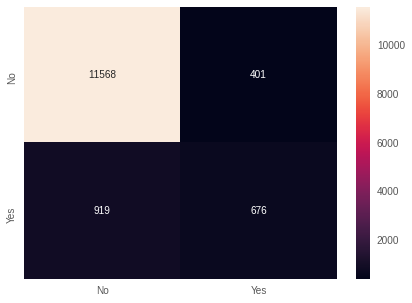

In [75]:
print(rfcl.score(X_test , y_test))
y_predict = rfcl.predict(X_test)

cm=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')


In [76]:
#Evaluate the model using accuracy, confusion metrix, and classification report
acc_rfcl=metrics.accuracy_score(y_test, y_predict)
pre_rfcl=metrics.precision_score(y_test, y_predict)
rec_rfcl=metrics.recall_score(y_test, y_predict)
f1_rfcl=metrics.f1_score(y_test, y_predict)
print("Accuracy Gradient Boosting:",acc_rfcl)
print('Confusion Matrix Random Forest: \n',metrics.confusion_matrix(y_test, y_predict))
print('Classification report Random Forest: \n',metrics.classification_report(y_test, y_predict))
print("Roc Auc Score:",roc_auc_score(y_test,y_predict))

Accuracy Gradient Boosting: 0.9026835741669124
Confusion Matrix Random Forest: 
 [[11568   401]
 [  919   676]]
Classification report Random Forest: 
               precision    recall  f1-score   support

           0       0.93      0.97      0.95     11969
           1       0.63      0.42      0.51      1595

    accuracy                           0.90     13564
   macro avg       0.78      0.70      0.73     13564
weighted avg       0.89      0.90      0.89     13564

Roc Auc Score: 0.6951606173838321


In [77]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'accuracy': acc_rfcl,'precision': pre_rfcl,'recall': rec_rfcl,'f1':f1_rfcl},index={'7'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','precision','recall','f1']]
results

,Method,accuracy,precision,recall,f1
1,Logistic Regression,0.88,0.52,0.18,0.27
2,Decision Tree,0.87,0.47,0.48,0.47
3,Pruned Decision Tree,0.90,0.57,0.47,0.51
4,Bagging,0.90,0.60,0.47,0.53
5,ADA Boosting,0.87,0.46,0.48,0.47
6,Gradient Boosting,0.90,0.64,0.35,0.45
7,Random Forest,0.90,0.63,0.42,0.51


Random Forest provides good overal results. Similarly to Gradient Boosting, it has a high precision score and high accuracy.

## Conclusion

Based on the dataframe above, we can see that different methods lead to different model performance.   

Model accuracy is high for all models and within a 3 points range from the least accurate (ADA Boosting) to the most accurate ones (Bagging, Gradient Boosting and Random Forest).   

Model precision and recall can however vary significantly from one method to another, therefore it is more reasonable to use those metrics to select a model.   
The business problem for the marketing team in this case is to identify future potential customers based on the probability of a random customer to subscribe term deposit. In our case that translates predicting target equal to 1. 

Prioritizing precision vs recall is always the question. Without any more specific information about how aggressive is the marketing team strategy, when and how they plan to achieve their objective and other specific business aspects, we will use the F1 score as a good overall indicator of model performance. In that case, Bagging seems to provide the best model performance, followed by Pruned Decision Tree and Random Forest, both with equal F1 score.  

If the compamy choses to focus on higher precision models (i.e reduce false positives) then Random Forest is a more appropriate model. If instead it perefers to focus on predicting less false negatives, then high recall models such as Bagging would be more suitable. 
